# WeRateDogs Project: Wrangling and Analyze Data

## Data Gathering

1. Directly download the WeRateDogs Twitter archive data (twitter_archive_enhanced.csv)

In [1]:
import re #This line imports regular expressions
import json
import numpy as np

import pandas as pd
import requests
import seaborn as sns
import matplotlib.pyplot as plt

pd.set_option('display.max_columns', 500)
pd.set_option('max_colwidth', 800) 
# pd.set_option('display.max_rows', 3000) # This line allows us to see all rows
# the first 2 lines help us not use the default pandas settings
# default pandas will cut some of the columns when there are many
# This will also help to show the full text inside the cell

np.random.seed(42) #.seed() makes random numbers predictable

In [2]:
df_archive = pd.read_csv('twitter-archive-enhanced.csv')
df_archive.head()

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
0,892420643555336193,NaN,NaN,2017-08-01 16:23:56 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892420643555336193/photo/1,13,10,Phineas,None,None,None,None
1,892177421306343426,NaN,NaN,2017-08-01 00:17:27 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","This is Tilly. She's just checking pup on you. Hopes you're doing ok. If not, she's available for pats, snugs, boops, the whole bit. 13/10 https://t.co/0Xxu71qeIV",NaN,NaN,NaN,https://twitter.com/dog_rates/status/892177421306343426/photo/1,13,10,Tilly,None,None,None,None
2,891815181378084864,NaN,NaN,2017-07-31 00:18:03 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Archie. He is a rare Norwegian Pouncing Corgo. Lives in the tall grass. You never know when one may strike. 12/10 https://t.co/wUnZnhtVJB,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891815181378084864/photo/1,12,10,Archie,None,None,None,None
3,891689557279858688,NaN,NaN,2017-07-30 15:58:51 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Darla. She commenced a snooze mid meal. 13/10 happens to the best of us https://t.co/tD36da7qLQ,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891689557279858688/photo/1,13,10,Darla,None,None,None,None
4,891327558926688256,NaN,NaN,2017-07-29 16:00:24 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","This is Franklin. He would like you to stop calling him ""cute."" He is a very fierce shark and should be respected as such. 12/10 #BarkWeek https://t.co/AtUZn91f7f",NaN,NaN,NaN,"https://twitter.com/dog_rates/status/891327558926688256/photo/1,https://twitter.com/dog_rates/status/891327558926688256/photo/1",12,10,Franklin,None,None,None,None


In [3]:
df_archive.shape #rows, columns

(2356, 17)

2. Use the Requests library to download the tweet image prediction (image_predictions.tsv)

In [4]:
url = 'https://d17h27t6h515a5.cloudfront.net/topher/2017/August/599fd2ad_image-predictions/image-predictions.tsv'
response = requests.get(url)
response.status_code

# 200 for .status_code means it was successful

200

In [5]:
with open("image_predictions.tsv", mode='wb') as file: 
# mode='wb' -->  writing binary mode
    file.write(response.content) 
# response.content --> we write inside the file 
# "image_predictions.tsv" the contents from response

In [6]:
df_image_predictions = pd.read_csv("image_predictions.tsv", sep='\t')
# because file is a tsv --> need argument sep='\t'

In [7]:
df_image_predictions.head()

,tweet_id,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog
0,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,1,Welsh_springer_spaniel,0.465074,True,collie,0.156665,True,Shetland_sheepdog,0.061428,True
1,666029285002620928,https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg,1,redbone,0.506826,True,miniature_pinscher,0.074192,True,Rhodesian_ridgeback,0.072010,True
2,666033412701032449,https://pbs.twimg.com/media/CT4521TWwAEvMyu.jpg,1,German_shepherd,0.596461,True,malinois,0.138584,True,bloodhound,0.116197,True
3,666044226329800704,https://pbs.twimg.com/media/CT5Dr8HUEAA-lEu.jpg,1,Rhodesian_ridgeback,0.408143,True,redbone,0.360687,True,miniature_pinscher,0.222752,True
4,666049248165822465,https://pbs.twimg.com/media/CT5IQmsXIAAKY4A.jpg,1,miniature_pinscher,0.560311,True,Rottweiler,0.243682,True,Doberman,0.154629,True


In [8]:
df_image_predictions.shape

(2075, 12)

In [9]:
df_image_predictions['img_num'].unique()

array([1, 4, 2, 3], dtype=int64)

3. Use the Tweepy library to query additional data via the Twitter API (tweet_json.txt) 

**Note**: If using the provided file, read the json file into a pandas dataframe.

In [10]:
# ##First 2 variables did contain my unique keys neede to access the API's and was successful.
# consumer_key = #My consumer key was entered here to run this code
# consumer_secret = #my consumer secret key was here to run this code
# auth = tweepy.AppAuthHandler(consumer_key, consumer_secret)
# api = tweepy.API(auth, wait_on_rate_limit = True)


# # Query Twitter's API for JSON data for each tweet ID in the Twitter archive
# count = 0
# fails_dict = {}
# # Save each tweet's returned JSON as a new line in a .txt file
# with open('tweet_json.txt', 'w') as outfile:
#     for tweet_id in tweet_ids:
#         count += 1
#         print(str(count) + ": " + str(tweet_id))
#         try:
#             tweet = api.get_status(tweet_id, tweet_mode='extended')
#             json.dump(tweet._json, outfile)
#             print("Success")
#             outfile.write('\n')
#         except Exception as e:
#             print("Fail")
#             fails_dict[tweet_id] = e
        

# print(fails_dict)
 
# # tweet_data = []
# # with open('tweet-json.txt') as file:
# #     for line in file:
# #         tweets_data.append(json.loads(line))

# # with open ('tweet-json.txt') as file:
# #     lines = file.readlines() #This reads each line, the info is a temporary python variable stored as lines
    
# # data = []
# # for line in lines:#each line is essentially a dictionary
# #     data.append(json.loads(line)) 

# # df_tweets = pd.DataFrame(data)

# # df_tweets

In [11]:
df_tweets = pd.read_json('tweet-json.txt', lines=True)

df_tweets

,created_at,id,id_str,full_text,truncated,display_text_range,entities,extended_entities,source,in_reply_to_status_id,in_reply_to_status_id_str,in_reply_to_user_id,in_reply_to_user_id_str,in_reply_to_screen_name,user,geo,coordinates,place,contributors,is_quote_status,retweet_count,favorite_count,favorited,retweeted,possibly_sensitive,possibly_sensitive_appealable,lang,retweeted_status,quoted_status_id,quoted_status_id_str,quoted_status
0,2017-08-01 16:23:56+00:00,892420643555336193,892420643555336192,This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU,False,"[0, 85]","{'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 892420639486877696, 'id_str': '892420639486877696', 'indices': [86, 109], 'media_url': 'http://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg', 'media_url_https': 'https://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg', 'url': 'https://t.co/MgUWQ76dJU', 'display_url': 'pic.twitter.com/MgUWQ76dJU', 'expanded_url': 'https://twitter.com/dog_rates/status/892420643555336193/photo/1', 'type': 'photo', 'sizes': {'large': {'w': 540, 'h': 528, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 540, 'h': 528, 'resize': 'fit'}, 'medium': {'w': 540, 'h': 528, 'resize': 'fit'}}}]}","{'media': [{'id': 892420639486877696, 'id_str': '892420639486877696', 'indices': [86, 109], 'media_url': 'http://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg', 'media_url_https': 'https://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg', 'url': 'https://t.co/MgUWQ76dJU', 'display_url': 'pic.twitter.com/MgUWQ76dJU', 'expanded_url': 'https://twitter.com/dog_rates/status/892420643555336193/photo/1', 'type': 'photo', 'sizes': {'large': {'w': 540, 'h': 528, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 540, 'h': 528, 'resize': 'fit'}, 'medium': {'w': 540, 'h': 528, 'resize': 'fit'}}}]}","<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",NaN,NaN,NaN,NaN,None,"{'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs™ (author)', 'screen_name': 'dog_rates', 'location': 'DM YOUR DOGS, WE WILL RATE', 'description': '#1 Source for Professional Dog Ratings | STORE: @ShopWeRateDogs | IG, FB & SC: WeRateDogs MOBILE APP: @GoodDogsGame | Business: dogratingtwitter@gmail.com', 'url': 'https://t.co/N7sNNHAEXS', 'entities': {'url': {'urls': [{'url': 'https://t.co/N7sNNHAEXS', 'expanded_url': 'http://weratedogs.com', 'display_url': 'weratedogs.com', 'indices': [0, 23]}]}, 'description': {'urls': []}}, 'protected': False, 'followers_count': 3200889, 'friends_count': 104, 'listed_count': 2784, 'created_at': 'Sun Nov 15 21:41:29 +0000 2015', 'favourites_count': 114031, 'utc_offset': None, 'time_zone': None, 'geo_enabled': True, 'verified': True, 'statu...",NaN,NaN,None,NaN,False,8853,39467,False,False,0.0,0.0,en,NaN,NaN,NaN,NaN
1,2017-08-01 00:17:27+00:00,892177421306343426,892177421306343424,"This is Tilly. She's just checking pup on you. Hopes you're doing ok. If not, she's available for pats, snugs, boops, the whole bit. 13/10 https://t.co/0Xxu71qeIV",False,"[0, 138]","{'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 892177413194625024, 'id_str': '892177413194625024', 'indices': [139, 162], 'media_url': 'http://pbs.twimg.com/media/DGGmoV4XsAAUL6n.jpg', 'media_url_https': 'https://pbs.twimg.com/media/DGGmoV4XsAAUL6n.jpg', 'url': 'https://t.co/0Xxu71qeIV', 'display_url': 'pic.twitter.com/0Xxu71qeIV', 'expanded_url': 'https://twitter.com/dog_rates/status/892177421306343426/photo/1', 'type': 'photo', 'sizes': {'large': {'w': 1407, 'h': 1600, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 598, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 1055, 'h': 1200, 'resize': 'fit'}}}]}","{'media': [{'id': 892177413194625024, 'id_str': '892177413194625024', 'indices': [139, 162], 'media_url': 'http://pbs.twimg.com/media/DGGmoV4XsAAUL6n.jpg', 'media_

In [12]:
df_tweets = df_tweets[['id', 'favorite_count', 'retweet_count']]

df_tweets

,id,favorite_count,retweet_count
0,892420643555336193,39467,8853
1,892177421306343426,33819,6514
2,891815181378084864,25461,4328
3,891689557279858688,42908,8964
4,891327558926688256,41048,9774
...,...,...,...
2349,666049248165822465,111,41
2350,666044226329800704,311,147
2351,666033412701032449,128,47
2352,666029285002620928,132,48


## Assessing Data
This is where both programmatic and visual assessment will be used.

Key points to remember when assessing the data:

* Only want original ratings (no retweets) that have images. Though there are 5000+ tweets in the dataset, not all are dog ratings and some are retweets.
  
* The fact that the rating numerators are greater than the denominators does not need to be cleaned. This [unique rating system](http://knowyourmeme.com/memes/theyre-good-dogs-brent) is a big part of the popularity of WeRateDogs.

* Do not gather the tweets beyond August 1st, 2017. Image predictions cannot be gathered for these tweets since access to the algorithm used is unavailable.



In [13]:
# 3 Dataframes: 
# df_archive 
# df_image_predictions
# df_tweets

# combine the 3 Dataframes using .merge() and LEFT JOIN (includes all rows, even those without images)

df = df_archive.merge(df_image_predictions, on=["tweet_id"], how='left') \
.merge(df_tweets, how='left', left_on=['tweet_id'], right_on=['id']) 
#looks for 'tweet_id' column from left tables and 'id' from right table (the one being joined) to join on


In [14]:
df.head(20)

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog,id,favorite_count,retweet_count
0,892420643555336193,NaN,NaN,2017-08-01 16:23:56 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892420643555336193/photo/1,13,10,Phineas,None,None,None,None,https://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg,1.0,orange,0.097049,False,bagel,0.085851,False,banana,0.076110,False,8.924206e+17,39467.0,8853.0
1,892177421306343426,NaN,NaN,2017-08-01 00:17:27 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","This is Tilly. She's just checking pup on you. Hopes you're doing ok. If not, she's available for pats, snugs, boops, the whole bit. 13/10 https://t.co/0Xxu71qeIV",NaN,NaN,NaN,https://twitter.com/dog_rates/status/892177421306343426/photo/1,13,10,Tilly,None,None,None,None,https://pbs.twimg.com/media/DGGmoV4XsAAUL6n.jpg,1.0,Chihuahua,0.323581,True,Pekinese,0.090647,True,papillon,0.068957,True,8.921774e+17,33819.0,6514.0
2,891815181378084864,NaN,NaN,2017-07-31 00:18:03 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Archie. He is a rare Norwegian Pouncing Corgo. Lives in the tall grass. You never know when one may strike. 12/10 https://t.co/wUnZnhtVJB,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891815181378084864/photo/1,12,10,Archie,None,None,None,None,https://pbs.twimg.com/media/DGBdLU1WsAANxJ9.jpg,1.0,Chihuahua,0.716012,True,malamute,0.078253,True,kelpie,0.031379,True,8.918152e+17,25461.0,4328.0
3,891689557279858688,NaN,NaN,2017-07-30 15:58:51 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Darla. She commenced a snooze mid meal. 13/10 happens to the best of us https://t.co/tD36da7qLQ,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891689557279858688/photo/1,13,10,Darla,None,None,None,None,https://pbs.twimg.com/media/DF_q7IAWsAEuuN8.jpg,1.0,paper_towel,0.170278,False,Labrador_retriever,0.168086,True,spatula,0.040836,False,8.916896e+17,42908.0,8964.0
4,891327558926688256,NaN,NaN,2017-07-29 16:00:24 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","This is Franklin. He would like you to stop calling him ""cute."" He is a very fierce shark and should be respected as such. 12/10 #BarkWeek https://t.co/AtUZn91f7f",NaN,NaN,NaN,"https://twitter.com/dog_rates/status/891327558926688256/photo/1,https://twitter.com/dog_rates/status/891327558926688256/photo/1",12,10,Franklin,None,None,None,None,https://pbs.twimg.com/media/DF6hr6BUMAAzZgT.jpg,2.0,basset,0.555712,True,English_springer,0.225770,True,German_short-haired_pointer,0.175219,True,8.913276e+17,41048.0,9774.0
5,891087950875897856,NaN,NaN,2017-07-29 00:08:17 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",Here we have a majestic great white breaching off South Africa's coast. Absolutely h*ckin breathtaking. 13/10 (IG: tucker_marlo) #BarkWeek https://t.co/kQ04fDDRmh,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891087950875897856/photo/1,13,10,None,None,None,None,None,https://pbs.twimg.com/media/DF3HwyEWsAABqE6.jpg,1.0,Chesapeake_Bay_retriever,0.425595,True,Irish_terrier,0.116317,True,Indian_elephant,0.076902,False,8.910880e+17,20562.0,3261.0
6,890971913173991426,NaN,NaN,2017-07-28 16:27:12 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",Meet Jax. He enjoys ice cream so much he gets nervous around it. 13/10 help Jax enjoy more things by clicking below\n\nhttps://t.c

In [15]:
df.shape

(2356, 31)

In [16]:
df['rating_denominator'].mean() #The denominator should only be 10, thus mean should be 10

10.455432937181664

In [17]:
print(df['rating_denominator'].loc[df['rating_denominator'] != 10]) 
#This reveals rows where the rating denominator is not 10

313       0
342      15
433      70
516       7
784      11
902     150
1068     11
1120    170
1165     20
1202     50
1228     90
1254     80
1274     50
1351     50
1433     40
1598     20
1634    130
1635    110
1662     11
1663     16
1779    120
1843     80
2335      2
Name: rating_denominator, dtype: int64


In [18]:
print(df['text'].loc[df['rating_denominator'] != 10]) 
# After inspecting the 'text' column, these ratings may be intentional 

313                                                                            @jonnysun @Lin_Manuel ok jomny I know you're excited but 960/00 isn't a valid rating, 13/10 is tho
342                                                                                                                                      @docmisterio account started on 11/15/15
433                                                                           The floofs have been released I repeat the floofs have been released. 84/70 https://t.co/NIYC820tmd
516     Meet Sam. She smiles 24/7 &amp; secretly aspires to be a reindeer. \nKeep Sam smiling by clicking and sharing this link:\nhttps://t.co/98tB8y7y7t https://t.co/LouL5vdvxx
784                                  RT @dog_rates: After so many requests, this is Bretagne. She was the last surviving 9/11 search dog, and our second ever 14/10. RIP https:/…
902                                                                                                Why does th

In [19]:
#Save df as CSV file

df.to_csv('twitter-archive-pre-clean.csv', index=False)

In [20]:
pd.read_csv('twitter-archive-pre-clean.csv')

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog,id,favorite_count,retweet_count
0,892420643555336193,NaN,NaN,2017-08-01 16:23:56 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892420643555336193/photo/1,13,10,Phineas,None,None,None,None,https://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg,1.0,orange,0.097049,False,bagel,0.085851,False,banana,0.076110,False,8.924206e+17,39467.0,8853.0
1,892177421306343426,NaN,NaN,2017-08-01 00:17:27 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","This is Tilly. She's just checking pup on you. Hopes you're doing ok. If not, she's available for pats, snugs, boops, the whole bit. 13/10 https://t.co/0Xxu71qeIV",NaN,NaN,NaN,https://twitter.com/dog_rates/status/892177421306343426/photo/1,13,10,Tilly,None,None,None,None,https://pbs.twimg.com/media/DGGmoV4XsAAUL6n.jpg,1.0,Chihuahua,0.323581,True,Pekinese,0.090647,True,papillon,0.068957,True,8.921774e+17,33819.0,6514.0
2,891815181378084864,NaN,NaN,2017-07-31 00:18:03 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Archie. He is a rare Norwegian Pouncing Corgo. Lives in the tall grass. You never know when one may strike. 12/10 https://t.co/wUnZnhtVJB,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891815181378084864/photo/1,12,10,Archie,None,None,None,None,https://pbs.twimg.com/media/DGBdLU1WsAANxJ9.jpg,1.0,Chihuahua,0.716012,True,malamute,0.078253,True,kelpie,0.031379,True,8.918152e+17,25461.0,4328.0
3,891689557279858688,NaN,NaN,2017-07-30 15:58:51 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Darla. She commenced a snooze mid meal. 13/10 happens to the best of us https://t.co/tD36da7qLQ,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891689557279858688/photo/1,13,10,Darla,None,None,None,None,https://pbs.twimg.com/media/DF_q7IAWsAEuuN8.jpg,1.0,paper_towel,0.170278,False,Labrador_retriever,0.168086,True,spatula,0.040836,False,8.916896e+17,42908.0,8964.0
4,891327558926688256,NaN,NaN,2017-07-29 16:00:24 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","This is Franklin. He would like you to stop calling him ""cute."" He is a very fierce shark and should be respected as such. 12/10 #BarkWeek https://t.co/AtUZn91f7f",NaN,NaN,NaN,"https://twitter.com/dog_rates/status/891327558926688256/photo/1,https://twitter.com/dog_rates/status/891327558926688256/photo/1",12,10,Franklin,None,None,None,None,https://pbs.twimg.com/media/DF6hr6BUMAAzZgT.jpg,2.0,basset,0.555712,True,English_springer,0.225770,True,German_short-haired_pointer,0.175219,True,8.913276e+17,41048.0,9774.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2351,666049248165822465,NaN,NaN,2015-11-16 00:24:50 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",Here we have a 1949 1st generation vulpix. Enjoys sweat tea and Fox News. Cannot be phased. 5/10 https://t.co/4B7cOc1EDq,NaN,NaN,NaN,https://twitter.com/dog_rates/status/666049248165822465/photo/1,5,10,None,None,None,None,None,https://pbs.twimg.com/media/CT5IQmsXIAAKY4A.jpg,1.0,miniature_pinscher,0.560311,True,Rottweiler,0.243682,True,Doberman,0.154629,True,6.660492e+17,111.0,41.0
2352,666044226329800704,NaN,NaN,2015-11-16 00:04:52 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is a purebred Piers Morgan. Loves to Netflix and chill.

### Quality Issues


**1. Column names are not descriptive enough**: img_num, p1, p1_conf, p1_dog, p2, p2_conf, p2_dog, p3, p3_conf, p3_dog


**2. Some column values for 'name' are invalid**: Each value should either be the dog's name, or 'None'. Upon inspection, invalid values are lowercase.


**3. There are rows which indicate the data is a retweet.** These should be removed. 

- If there is data in retweeted_status_id --> remove row
- Remove columns in which values are mostly NaN or None: in_reply_to_status_id, in_reply_to_user_id, retweeted_status_id, retweeted_status_user_id, retweeted_status_timestamp
      
**4. Change columns to correct data type:**

- ID columns --> string datatype 
- Categorical variables --> category datatype 
- Time-related columns --> datetime datatype 
- Count-related columns --> integer datatype 
- Numerator and denominator --> float data type
    

**5. For the timestamp column, split the column into a date and time for readability of content**


**6. For dog breed prediction columns ('first_prediction', 'second_prediction', 'third_prediction')**:
- Underscores instead of spaces in names
- All breeds need to be capitalized


**7. Remove the HTML from column 'source' for readability**: only include URL and device info


**8. The column 'text' contains a URL.** These should be removed so that only the text remains.


### Tidiness issues (structural issues)

1. **The three dataframes are separated individually** --> merge into one dataframe 

2. **Combine all dog label columns into one column** (doggo, floofer, pupper, puppo)

## Cleaning Data


In [72]:
# Make copies of original pieces of data
df_clean = df.copy()

In [73]:
df_clean

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog,id,favorite_count,retweet_count
0,892420643555336193,NaN,NaN,2017-08-01 16:23:56 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892420643555336193/photo/1,13,10,Phineas,None,None,None,None,https://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg,1.0,orange,0.097049,False,bagel,8.585110e-02,False,banana,7.611000e-02,False,8.924206e+17,39467.0,8853.0
1,892177421306343426,NaN,NaN,2017-08-01 00:17:27 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","This is Tilly. She's just checking pup on you. Hopes you're doing ok. If not, she's available for pats, snugs, boops, the whole bit. 13/10 https://t.co/0Xxu71qeIV",NaN,NaN,NaN,https://twitter.com/dog_rates/status/892177421306343426/photo/1,13,10,Tilly,None,None,None,None,https://pbs.twimg.com/media/DGGmoV4XsAAUL6n.jpg,1.0,Chihuahua,0.323581,True,Pekinese,9.064650e-02,True,papillon,6.895690e-02,True,8.921774e+17,33819.0,6514.0
2,891815181378084864,NaN,NaN,2017-07-31 00:18:03 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Archie. He is a rare Norwegian Pouncing Corgo. Lives in the tall grass. You never know when one may strike. 12/10 https://t.co/wUnZnhtVJB,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891815181378084864/photo/1,12,10,Archie,None,None,None,None,https://pbs.twimg.com/media/DGBdLU1WsAANxJ9.jpg,1.0,Chihuahua,0.716012,True,malamute,7.825300e-02,True,kelpie,3.137890e-02,True,8.918152e+17,25461.0,4328.0
3,891689557279858688,NaN,NaN,2017-07-30 15:58:51 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Darla. She commenced a snooze mid meal. 13/10 happens to the best of us https://t.co/tD36da7qLQ,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891689557279858688/photo/1,13,10,Darla,None,None,None,None,https://pbs.twimg.com/media/DF_q7IAWsAEuuN8.jpg,1.0,paper_towel,0.170278,False,Labrador_retriever,1.680860e-01,True,spatula,4.083590e-02,False,8.916896e+17,42908.0,8964.0
4,891327558926688256,NaN,NaN,2017-07-29 16:00:24 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","This is Franklin. He would like you to stop calling him ""cute."" He is a very fierce shark and should be respected as such. 12/10 #BarkWeek https://t.co/AtUZn91f7f",NaN,NaN,NaN,"https://twitter.com/dog_rates/status/891327558926688256/photo/1,https://twitter.com/dog_rates/status/891327558926688256/photo/1",12,10,Franklin,None,None,None,None,https://pbs.twimg.com/media/DF6hr6BUMAAzZgT.jpg,2.0,basset,0.555712,True,English_springer,2.257700e-01,True,German_short-haired_pointer,1.752190e-01,True,8.913276e+17,41048.0,9774.0
5,891087950875897856,NaN,NaN,2017-07-29 00:08:17 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",Here we have a majestic great white breaching off South Africa's coast. Absolutely h*ckin breathtaking. 13/10 (IG: tucker_marlo) #BarkWeek https://t.co/kQ04fDDRmh,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891087950875897856/photo/1,13,10,None,None,None,None,None,https://pbs.twimg.com/media/DF3HwyEWsAABqE6.jpg,1.0,Chesapeake_Bay_retriever,0.425595,True,Irish_terrier,1.163170e-01,True,Indian_elephant,7.690220e-02,False,8.910880e+17,20562.0,3261.0
6,890971913173991426,NaN,NaN,2017-07-28 16:27:12 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",Meet Jax. He enjoys ice cream so much he gets nervous around it. 13/10 help Jax en

### Issue #1: Column names are not descriptive

#### Define: 
Some of the column names ('p1', 'p1_conf', etc.) are not descriptive.I will rename the non-descript columns using .rename() and ensure to overwrite the column names with 'inplace=True'

These columns will be renamed to be easily understood:
- p1 = first_prediction
- p1_conf = first_prediction_confidence
- p1_dog = first_prediction_is_dog
- p2 = second_prediction
- p2_conf = second_prediction_confidence
- p2_dog = second_prediction_is_dog

#### Code

In [74]:
df_clean.rename(columns={'img_num':'image_number', 
                                    'p1':'first_prediction', 
                                    'p1_conf':'first_prediction_confidence', 
                                    'p1_dog':'first_prediction_is_dog', 
                                    'p2':'second_prediction', 
                                    'p2_conf':'second_prediction_confidence', 
                                    'p2_dog':'second_prediction_is_dog', 
                                    'p3':'third_prediction', 
                                    'p3_conf':'third_prediction_confidence', 
                                    'p3_dog':'third_prediction_is_dog'}, inplace=True)



In [75]:
df_clean.tail(20)

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo,jpg_url,image_number,first_prediction,first_prediction_confidence,first_prediction_is_dog,second_prediction,second_prediction_confidence,second_prediction_is_dog,third_prediction,third_prediction_confidence,third_prediction_is_dog,id,favorite_count,retweet_count
2336,666273097616637952,NaN,NaN,2015-11-16 15:14:19 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",Can take selfies 11/10 https://t.co/ws2AMaNwPW,NaN,NaN,NaN,https://twitter.com/dog_rates/status/666273097616637952/photo/1,11,10,None,None,None,None,None,https://pbs.twimg.com/media/CT8T1mtUwAA3aqm.jpg,1.0,Italian_greyhound,0.176053,True,toy_terrier,0.111884,True,basenji,0.111152,True,6.662731e+17,184.0,82.0
2337,666268910803644416,NaN,NaN,2015-11-16 14:57:41 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",Very concerned about fellow dog trapped in computer. 10/10 https://t.co/0yxApIikpk,NaN,NaN,NaN,https://twitter.com/dog_rates/status/666268910803644416/photo/1,10,10,None,None,None,None,None,https://pbs.twimg.com/media/CT8QCd1WEAADXws.jpg,1.0,desktop_computer,0.086502,False,desk,0.085547,False,bookcase,0.079480,False,6.662689e+17,108.0,37.0
2338,666104133288665088,NaN,NaN,2015-11-16 04:02:55 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",Not familiar with this breed. No tail (weird). Only 2 legs. Doesn't bark. Surprisingly quick. Shits eggs. 1/10 https://t.co/Asgdc6kuLX,NaN,NaN,NaN,https://twitter.com/dog_rates/status/666104133288665088/photo/1,1,10,None,None,None,None,None,https://pbs.twimg.com/media/CT56LSZWoAAlJj2.jpg,1.0,hen,0.965932,False,cock,0.033919,False,partridge,0.000052,False,6.661041e+17,14765.0,6871.0
2339,666102155909144576,NaN,NaN,2015-11-16 03:55:04 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",Oh my. Here you are seeing an Adobe Setter giving birth to twins!!! The world is an amazing place. 11/10 https://t.co/11LvqN4WLq,NaN,NaN,NaN,https://twitter.com/dog_rates/status/666102155909144576/photo/1,11,10,None,None,None,None,None,https://pbs.twimg.com/media/CT54YGiWUAEZnoK.jpg,1.0,English_setter,0.298617,True,Newfoundland,0.149842,True,borzoi,0.133649,True,6.661022e+17,81.0,16.0
2340,666099513787052032,NaN,NaN,2015-11-16 03:44:34 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",Can stand on stump for what seems like a while. Built that birdhouse? Impressive. Made friends with a squirrel. 8/10 https://t.co/Ri4nMTLq5C,NaN,NaN,NaN,https://twitter.com/dog_rates/status/666099513787052032/photo/1,8,10,None,None,None,None,None,https://pbs.twimg.com/media/CT51-JJUEAA6hV8.jpg,1.0,Lhasa,0.582330,True,Shih-Tzu,0.166192,True,Dandie_Dinmont,0.089688,True,6.660995e+17,164.0,73.0
2341,666094000022159362,NaN,NaN,2015-11-16 03:22:39 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This appears to be a Mongolian Presbyterian mix. Very tired. Tongue slip confirmed. 9/10 would lie down with https://t.co/mnioXo3IfP,NaN,NaN,NaN,https://twitter.com/dog_rates/status/666094000022159362/photo/1,9,10,None,None,None,None,None,https://pbs.twimg.com/media/CT5w9gUW4AAsBNN.jpg,1.0,bloodhound,0.195217,True,German_shepherd,0.078260,True,malinois,0.075628,True,6.660940e+17,169.0,79.0
2342,666082916733198337,NaN,NaN,2015-11-16 02:38:37 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",Here we have a well-established sunblockerspaniel. Lost his other flip-flop. 6/10 not very waterproof https://t.co/3RU6x0vHB7,NaN,NaN,NaN,https://twitter.com/dog_rates/status/666082916733198337/photo/1,6,10,None,None,None,None,None,https://pbs.twimg.com/media/CT5m4VG

#### Test

In [77]:
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2356 entries, 0 to 2355
Data columns (total 31 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   tweet_id                      2356 non-null   int64  
 1   in_reply_to_status_id         78 non-null     float64
 2   in_reply_to_user_id           78 non-null     float64
 3   timestamp                     2356 non-null   object 
 4   source                        2356 non-null   object 
 5   text                          2356 non-null   object 
 6   retweeted_status_id           181 non-null    float64
 7   retweeted_status_user_id      181 non-null    float64
 8   retweeted_status_timestamp    181 non-null    object 
 9   expanded_urls                 2297 non-null   object 
 10  rating_numerator              2356 non-null   int64  
 11  rating_denominator            2356 non-null   int64  
 12  name                          2356 non-null   object 
 13  dog

### Issue #2: Invalid row values for the column 'name'

#### Define: 
In the column 'name', there are values that are not names ('just', 'the', 'a', etc). Upon investigation, the invalid names are lowercase, and can be replaced with 'None' using such condition to check each row. First, iterate through each row in the column 'name'. Then check if the first character in the string value is lowercase. Create an if statement that checks and then replaces the row value with 'None' if it began with a lowercase letter.

#### Code

In [78]:
pd.set_option('display.max_rows', None) #invalid values are lower case
df_clean['name'].value_counts()

None              745
a                  55
Charlie            12
Cooper             11
Lucy               11
Oliver             11
Tucker             10
Penny              10
Lola               10
Winston             9
Bo                  9
Sadie               8
the                 8
Daisy               7
Buddy               7
Toby                7
an                  7
Bailey              7
Leo                 6
Oscar               6
Stanley             6
Rusty               6
Bella               6
Dave                6
Jack                6
Koda                6
Scout               6
Jax                 6
Milo                6
Louis               5
Phil                5
Sammy               5
Gus                 5
Chester             5
Alfie               5
Sunny               5
Bentley             5
very                5
Oakley              5
Finn                5
George              5
Larry               5
Clarence            4
Loki                4
Walter              4
Reggie    

In [79]:
df_clean['name'].tail(20) #check to find invalid values

2336    None
2337    None
2338    None
2339    None
2340    None
2341    None
2342    None
2343    None
2344    None
2345     the
2346     the
2347       a
2348       a
2349      an
2350       a
2351    None
2352       a
2353       a
2354       a
2355    None
Name: name, dtype: object

In [80]:
#Want to check each row of 'name', if lowercase replace with 'None', if uppercase then leave value

for names in df_clean['name']:
    if names[0].islower():
        df_clean['name'].replace(names, 'None', inplace=True)


#### Test

In [81]:
df_clean['name'].tail(20) # We can see the values are assigned as 'None'

2336    None
2337    None
2338    None
2339    None
2340    None
2341    None
2342    None
2343    None
2344    None
2345    None
2346    None
2347    None
2348    None
2349    None
2350    None
2351    None
2352    None
2353    None
2354    None
2355    None
Name: name, dtype: object

### Issue #3: Dataset includes rows and columns that contain retweets

#### Define: 
There are rows and columns which indicate the data included is a retweet: in_reply_to_status_id, in_reply_to_user_id, retweeted_status_id, retweeted_status_user_id, retweeted_status_timestamp

First, I can iterate through 'retweeted_status_id' and 'in_reply_status_id' to remove any value that is not NaN. A not NaN value indicates the data is a retweet. Then, I can remove all columns which are related to retweet data using .drop(): in_reply_to_status_id, in_reply_to_user_id, retweeted_status_id, retweeted_status_user_id, retweeted_status_timestamp


#### Code:

In [82]:
#Iterate through each row in 'retweeted_status_id': if not NaN, then remove row

for i, value in df_clean.iterrows():
    if not pd.isnull(value['retweeted_status_id']):
        # Remove the row if the value is not 'NaN'
        df_clean.drop(i, inplace=True)

In [83]:
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2175 entries, 0 to 2355
Data columns (total 31 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   tweet_id                      2175 non-null   int64  
 1   in_reply_to_status_id         78 non-null     float64
 2   in_reply_to_user_id           78 non-null     float64
 3   timestamp                     2175 non-null   object 
 4   source                        2175 non-null   object 
 5   text                          2175 non-null   object 
 6   retweeted_status_id           0 non-null      float64
 7   retweeted_status_user_id      0 non-null      float64
 8   retweeted_status_timestamp    0 non-null      object 
 9   expanded_urls                 2117 non-null   object 
 10  rating_numerator              2175 non-null   int64  
 11  rating_denominator            2175 non-null   int64  
 12  name                          2175 non-null   object 
 13  dog

In [84]:
#Still 78 row with retweet data as seen in 'in_reply_to_status_id'.
#Iterate through each row in 'in_reply_to_status_id': if not NaN, then remove row

for i, value in df_clean.iterrows():
    if not pd.isnull(value['in_reply_to_status_id']):
        # Remove the row if the value is not 'NaN'
        df_clean.drop(i, inplace=True)

In [85]:
# Remove columns related to retweets: 

df_clean = df_clean.drop(['in_reply_to_status_id', 'in_reply_to_user_id', 'retweeted_status_id', 'retweeted_status_user_id', 'retweeted_status_timestamp'], axis=1)

#### Test:

In [86]:
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2097 entries, 0 to 2355
Data columns (total 26 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   tweet_id                      2097 non-null   int64  
 1   timestamp                     2097 non-null   object 
 2   source                        2097 non-null   object 
 3   text                          2097 non-null   object 
 4   expanded_urls                 2094 non-null   object 
 5   rating_numerator              2097 non-null   int64  
 6   rating_denominator            2097 non-null   int64  
 7   name                          2097 non-null   object 
 8   doggo                         2097 non-null   object 
 9   floofer                       2097 non-null   object 
 10  pupper                        2097 non-null   object 
 11  puppo                         2097 non-null   object 
 12  jpg_url                       1971 non-null   object 
 13  ima

### Issue #4: Some columns are not correct data type

#### Define: 
After inspecting the column data types using .info(), there are several columns that had incorrect data types: 
tweet_id, id, doggo, floofer, pupper, puppo, favorite_count, retweet_count, rating_numerator, rating_denominator. I can use .astype() to convert the columns:

  - ID columns --> string datatype 
  - Categorical variables --> category datatype
  - Time-related columns --> datetime datatype 
  - Count-related columns --> integer datatype 
  - Numerator and denominator --> float data type

#### Code: 


In [87]:
df_clean.info() # We can observe some incorrect data types below

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2097 entries, 0 to 2355
Data columns (total 26 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   tweet_id                      2097 non-null   int64  
 1   timestamp                     2097 non-null   object 
 2   source                        2097 non-null   object 
 3   text                          2097 non-null   object 
 4   expanded_urls                 2094 non-null   object 
 5   rating_numerator              2097 non-null   int64  
 6   rating_denominator            2097 non-null   int64  
 7   name                          2097 non-null   object 
 8   doggo                         2097 non-null   object 
 9   floofer                       2097 non-null   object 
 10  pupper                        2097 non-null   object 
 11  puppo                         2097 non-null   object 
 12  jpg_url                       1971 non-null   object 
 13  ima

In [88]:
# Convert columns:
#     - ID columns --> string datatype 
#     - Categorical variables --> category datatype 
#     - Time-related columns --> datetime datatype 
#     - Count-related columns --> integer datatype 
#     - Numerator and denominator --> float data type

df_clean = df_clean.astype({'tweet_id':'str',
                            'id':'str',  
                            'favorite_count':'int', 
                            'retweet_count':'int', 
                            'rating_numerator':'float64', 
                            'rating_denominator':'float64'})


In [89]:
df_clean['timestamp'] = pd.to_datetime(df_clean['timestamp'])
#df_clean['timestamp'] = pd.DatetimeIndex(df_clean['timestamp']) #might need before splitting

#### Test: 


In [90]:
df_clean.info() #Data types have been corrected to what is expected data type

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2097 entries, 0 to 2355
Data columns (total 26 columns):
 #   Column                        Non-Null Count  Dtype              
---  ------                        --------------  -----              
 0   tweet_id                      2097 non-null   object             
 1   timestamp                     2097 non-null   datetime64[ns, UTC]
 2   source                        2097 non-null   object             
 3   text                          2097 non-null   object             
 4   expanded_urls                 2094 non-null   object             
 5   rating_numerator              2097 non-null   float64            
 6   rating_denominator            2097 non-null   float64            
 7   name                          2097 non-null   object             
 8   doggo                         2097 non-null   object             
 9   floofer                       2097 non-null   object             
 10  pupper                        2097 n

### Issue #5: Timestamp column is not as readable and will need to be split

#### Define: 
The 'timestamp' column can be split into a 'date' and 'time' column to have better readability. To do so, I will create a column 'date_time' which is an object on which I can then split the column to create 'date' and 'time' using the attributes .date and .time. As to not have redundancy, I will then drop 'timestamp' and 'date_time' from the data.

#### Code:

In [91]:
#Create a date and time columns from timestamp column

#df_clean['date_time'] = pd.DatetimeIndex(df_clean['timestamp'])

date_time = pd.DatetimeIndex(df_clean['timestamp'])

df_clean['date'] = date_time.date
df_clean['time'] = date_time.time

#Convert the date column to the appropriate data type
df_clean['date'] = pd.to_datetime(df_clean['date'])

In [94]:
#drop timestamp and date_time

df_clean = df_clean.drop(['timestamp'], axis=1)

#### Test:

In [95]:
df_clean.head()

,tweet_id,source,text,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo,jpg_url,image_number,first_prediction,first_prediction_confidence,first_prediction_is_dog,second_prediction,second_prediction_confidence,second_prediction_is_dog,third_prediction,third_prediction_confidence,third_prediction_is_dog,id,favorite_count,retweet_count,date,time
0,892420643555336193,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU,https://twitter.com/dog_rates/status/892420643555336193/photo/1,13.0,10.0,Phineas,None,None,None,None,https://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg,1.0,orange,0.097049,False,bagel,0.085851,False,banana,0.076110,False,8.924206435553362e+17,39467,8853,2017-08-01,16:23:56
1,892177421306343426,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","This is Tilly. She's just checking pup on you. Hopes you're doing ok. If not, she's available for pats, snugs, boops, the whole bit. 13/10 https://t.co/0Xxu71qeIV",https://twitter.com/dog_rates/status/892177421306343426/photo/1,13.0,10.0,Tilly,None,None,None,None,https://pbs.twimg.com/media/DGGmoV4XsAAUL6n.jpg,1.0,Chihuahua,0.323581,True,Pekinese,0.090647,True,papillon,0.068957,True,8.921774213063434e+17,33819,6514,2017-08-01,00:17:27
2,891815181378084864,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Archie. He is a rare Norwegian Pouncing Corgo. Lives in the tall grass. You never know when one may strike. 12/10 https://t.co/wUnZnhtVJB,https://twitter.com/dog_rates/status/891815181378084864/photo/1,12.0,10.0,Archie,None,None,None,None,https://pbs.twimg.com/media/DGBdLU1WsAANxJ9.jpg,1.0,Chihuahua,0.716012,True,malamute,0.078253,True,kelpie,0.031379,True,8.918151813780849e+17,25461,4328,2017-07-31,00:18:03
3,891689557279858688,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Darla. She commenced a snooze mid meal. 13/10 happens to the best of us https://t.co/tD36da7qLQ,https://twitter.com/dog_rates/status/891689557279858688/photo/1,13.0,10.0,Darla,None,None,None,None,https://pbs.twimg.com/media/DF_q7IAWsAEuuN8.jpg,1.0,paper_towel,0.170278,False,Labrador_retriever,0.168086,True,spatula,0.040836,False,8.916895572798587e+17,42908,8964,2017-07-30,15:58:51
4,891327558926688256,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","This is Franklin. He would like you to stop calling him ""cute."" He is a very fierce shark and should be respected as such. 12/10 #BarkWeek https://t.co/AtUZn91f7f","https://twitter.com/dog_rates/status/891327558926688256/photo/1,https://twitter.com/dog_rates/status/891327558926688256/photo/1",12.0,10.0,Franklin,None,None,None,None,https://pbs.twimg.com/media/DF6hr6BUMAAzZgT.jpg,2.0,basset,0.555712,True,English_springer,0.225770,True,German_short-haired_pointer,0.175219,True,8.913275589266883e+17,41048,9774,2017-07-29,16:00:24


### Issue #6: Inconsistent row values for breed prediction columns

#### Define:

For the dog breed prediction columns ('first_prediction', 'second_prediction', 'third_prediction'):
    - There are underscores instead of spaces in the dog breed names
    - All breeds need to be capitalized
    
To replace the underscores with spaces, I will need to use .str.replace() to select the underscores and replace them with spaces.

To capitalize each dog breed name, select the column and use .str.title().

#### Code:

In [42]:
# Replace underscores with spaces

df_clean['first_prediction'] = df_clean['first_prediction'].str.replace('_', ' ')
df_clean['second_prediction'] = df_clean['second_prediction'].str.replace('_', ' ')
df_clean['third_prediction'] = df_clean['third_prediction'].str.replace('_', ' ')



In [43]:
# Capitalize dog breed names

df_clean['first_prediction'] = df_clean['first_prediction'].str.title()
df_clean['second_prediction'] = df_clean['second_prediction'].str.title()
df_clean['third_prediction'] = df_clean['third_prediction'].str.title()



#### Test:

In [44]:
df_clean.head()

,tweet_id,source,text,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo,jpg_url,image_number,first_prediction,first_prediction_confidence,first_prediction_is_dog,second_prediction,second_prediction_confidence,second_prediction_is_dog,third_prediction,third_prediction_confidence,third_prediction_is_dog,id,favorite_count,retweet_count,date,time
0,892420643555336193,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU,https://twitter.com/dog_rates/status/892420643555336193/photo/1,13.0,10.0,Phineas,None,None,None,None,https://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg,1.0,Orange,0.097049,False,Bagel,0.085851,False,Banana,0.076110,False,8.924206435553362e+17,39467,8853,2017-08-01,16:23:56
1,892177421306343426,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","This is Tilly. She's just checking pup on you. Hopes you're doing ok. If not, she's available for pats, snugs, boops, the whole bit. 13/10 https://t.co/0Xxu71qeIV",https://twitter.com/dog_rates/status/892177421306343426/photo/1,13.0,10.0,Tilly,None,None,None,None,https://pbs.twimg.com/media/DGGmoV4XsAAUL6n.jpg,1.0,Chihuahua,0.323581,True,Pekinese,0.090647,True,Papillon,0.068957,True,8.921774213063434e+17,33819,6514,2017-08-01,00:17:27
2,891815181378084864,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Archie. He is a rare Norwegian Pouncing Corgo. Lives in the tall grass. You never know when one may strike. 12/10 https://t.co/wUnZnhtVJB,https://twitter.com/dog_rates/status/891815181378084864/photo/1,12.0,10.0,Archie,None,None,None,None,https://pbs.twimg.com/media/DGBdLU1WsAANxJ9.jpg,1.0,Chihuahua,0.716012,True,Malamute,0.078253,True,Kelpie,0.031379,True,8.918151813780849e+17,25461,4328,2017-07-31,00:18:03
3,891689557279858688,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Darla. She commenced a snooze mid meal. 13/10 happens to the best of us https://t.co/tD36da7qLQ,https://twitter.com/dog_rates/status/891689557279858688/photo/1,13.0,10.0,Darla,None,None,None,None,https://pbs.twimg.com/media/DF_q7IAWsAEuuN8.jpg,1.0,Paper Towel,0.170278,False,Labrador Retriever,0.168086,True,Spatula,0.040836,False,8.916895572798587e+17,42908,8964,2017-07-30,15:58:51
4,891327558926688256,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","This is Franklin. He would like you to stop calling him ""cute."" He is a very fierce shark and should be respected as such. 12/10 #BarkWeek https://t.co/AtUZn91f7f","https://twitter.com/dog_rates/status/891327558926688256/photo/1,https://twitter.com/dog_rates/status/891327558926688256/photo/1",12.0,10.0,Franklin,None,None,None,None,https://pbs.twimg.com/media/DF6hr6BUMAAzZgT.jpg,2.0,Basset,0.555712,True,English Springer,0.225770,True,German Short-Haired Pointer,0.175219,True,8.913275589266883e+17,41048,9774,2017-07-29,16:00:24


### Issue #7: Source column contains HTML tags

#### Define:

The 'source' column contains HTML tags in the values which affect readability. To remove the HTML tags from column 'source' I will slice the values to exclude the tags at the beginning and end of the string values using .str.slice(), and use this to make a new column. Then, I'll replace the remaining unwanted characters using .replace(). Once the values display with more readability, the original 'source' column will be dropped.




#### Code:

In [45]:
df_clean.head() # HTML tags are in 'source' column, we will need to remove them

,tweet_id,source,text,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo,jpg_url,image_number,first_prediction,first_prediction_confidence,first_prediction_is_dog,second_prediction,second_prediction_confidence,second_prediction_is_dog,third_prediction,third_prediction_confidence,third_prediction_is_dog,id,favorite_count,retweet_count,date,time
0,892420643555336193,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU,https://twitter.com/dog_rates/status/892420643555336193/photo/1,13.0,10.0,Phineas,None,None,None,None,https://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg,1.0,Orange,0.097049,False,Bagel,0.085851,False,Banana,0.076110,False,8.924206435553362e+17,39467,8853,2017-08-01,16:23:56
1,892177421306343426,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","This is Tilly. She's just checking pup on you. Hopes you're doing ok. If not, she's available for pats, snugs, boops, the whole bit. 13/10 https://t.co/0Xxu71qeIV",https://twitter.com/dog_rates/status/892177421306343426/photo/1,13.0,10.0,Tilly,None,None,None,None,https://pbs.twimg.com/media/DGGmoV4XsAAUL6n.jpg,1.0,Chihuahua,0.323581,True,Pekinese,0.090647,True,Papillon,0.068957,True,8.921774213063434e+17,33819,6514,2017-08-01,00:17:27
2,891815181378084864,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Archie. He is a rare Norwegian Pouncing Corgo. Lives in the tall grass. You never know when one may strike. 12/10 https://t.co/wUnZnhtVJB,https://twitter.com/dog_rates/status/891815181378084864/photo/1,12.0,10.0,Archie,None,None,None,None,https://pbs.twimg.com/media/DGBdLU1WsAANxJ9.jpg,1.0,Chihuahua,0.716012,True,Malamute,0.078253,True,Kelpie,0.031379,True,8.918151813780849e+17,25461,4328,2017-07-31,00:18:03
3,891689557279858688,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Darla. She commenced a snooze mid meal. 13/10 happens to the best of us https://t.co/tD36da7qLQ,https://twitter.com/dog_rates/status/891689557279858688/photo/1,13.0,10.0,Darla,None,None,None,None,https://pbs.twimg.com/media/DF_q7IAWsAEuuN8.jpg,1.0,Paper Towel,0.170278,False,Labrador Retriever,0.168086,True,Spatula,0.040836,False,8.916895572798587e+17,42908,8964,2017-07-30,15:58:51
4,891327558926688256,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","This is Franklin. He would like you to stop calling him ""cute."" He is a very fierce shark and should be respected as such. 12/10 #BarkWeek https://t.co/AtUZn91f7f","https://twitter.com/dog_rates/status/891327558926688256/photo/1,https://twitter.com/dog_rates/status/891327558926688256/photo/1",12.0,10.0,Franklin,None,None,None,None,https://pbs.twimg.com/media/DF6hr6BUMAAzZgT.jpg,2.0,Basset,0.555712,True,English Springer,0.225770,True,German Short-Haired Pointer,0.175219,True,8.913275589266883e+17,41048,9774,2017-07-29,16:00:24


In [46]:
# Create a new column 'source_url_device' with cleaned values. Slice 'out' the unwanted beginning and end of the string.

df_clean['source_url_device'] = df_clean['source'].str.slice(8, -4)


In [47]:
df_clean.head() #check slice

,tweet_id,source,text,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo,jpg_url,image_number,first_prediction,first_prediction_confidence,first_prediction_is_dog,second_prediction,second_prediction_confidence,second_prediction_is_dog,third_prediction,third_prediction_confidence,third_prediction_is_dog,id,favorite_count,retweet_count,date,time,source_url_device
0,892420643555336193,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU,https://twitter.com/dog_rates/status/892420643555336193/photo/1,13.0,10.0,Phineas,None,None,None,None,https://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg,1.0,Orange,0.097049,False,Bagel,0.085851,False,Banana,0.076110,False,8.924206435553362e+17,39467,8853,2017-08-01,16:23:56,"""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone"
1,892177421306343426,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","This is Tilly. She's just checking pup on you. Hopes you're doing ok. If not, she's available for pats, snugs, boops, the whole bit. 13/10 https://t.co/0Xxu71qeIV",https://twitter.com/dog_rates/status/892177421306343426/photo/1,13.0,10.0,Tilly,None,None,None,None,https://pbs.twimg.com/media/DGGmoV4XsAAUL6n.jpg,1.0,Chihuahua,0.323581,True,Pekinese,0.090647,True,Papillon,0.068957,True,8.921774213063434e+17,33819,6514,2017-08-01,00:17:27,"""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone"
2,891815181378084864,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Archie. He is a rare Norwegian Pouncing Corgo. Lives in the tall grass. You never know when one may strike. 12/10 https://t.co/wUnZnhtVJB,https://twitter.com/dog_rates/status/891815181378084864/photo/1,12.0,10.0,Archie,None,None,None,None,https://pbs.twimg.com/media/DGBdLU1WsAANxJ9.jpg,1.0,Chihuahua,0.716012,True,Malamute,0.078253,True,Kelpie,0.031379,True,8.918151813780849e+17,25461,4328,2017-07-31,00:18:03,"""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone"
3,891689557279858688,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Darla. She commenced a snooze mid meal. 13/10 happens to the best of us https://t.co/tD36da7qLQ,https://twitter.com/dog_rates/status/891689557279858688/photo/1,13.0,10.0,Darla,None,None,None,None,https://pbs.twimg.com/media/DF_q7IAWsAEuuN8.jpg,1.0,Paper Towel,0.170278,False,Labrador Retriever,0.168086,True,Spatula,0.040836,False,8.916895572798587e+17,42908,8964,2017-07-30,15:58:51,"""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone"
4,891327558926688256,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","This is Franklin. He would like you to stop calling him ""cute."" He is a very fierce shark and should be respected as such. 12/10 #BarkWeek https://t.co/AtUZn91f7f","https://twitter.com/dog_rates/status/891327558926688256/photo/1,https://twitter.com/dog_rates/status/891327558926688256/photo/1",12.0,10.0,Franklin,None,None,None,None,https://pbs.twimg.com/media/DF6hr6BUMAAzZgT.jpg,2.0,Basset,0.555712,True,English Springer,0.225770,True,German Short-Haired Pointer,0.175219,True,8.913275589266883e+17,41048,9774,2017-07-29,16:00:24,"""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone"


In [48]:
#unwanted_str = '" rel="nofollow">'

# for i in df_clean['source_url_device']:
#         df_clean['source_url_device'].replace('" rel="nofollow">', ' ', inplace=True)

#df_clean['source_url_device'].str.replace('', expand=True)


df_clean['source_url_device'].describe # the quotes are 'connected' to the url still. This is why replace won't work above

<bound method NDFrame.describe of 0        "http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone
1        "http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone
2        "http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone
3        "http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone
4        "http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone
5        "http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone
6        "http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone
7        "http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone
8        "http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone
9        "http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone
10       "http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone
11       "http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone
12    

In [49]:
# Create a variable unwanted_str, and use it to remove the middle unwanted section of the string values, replace with a space

unwanted_str = ' rel="nofollow">'

df_clean['source_url_device'] = df_clean['source_url_device'].str.replace(unwanted_str, ' ')

In [50]:
#drop original 'source' column


df_clean = df_clean.drop(['source'], axis=1)

#### Test:

In [51]:
df_clean.head() #'source' column with HTML tags removed, more readable!

,tweet_id,text,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo,jpg_url,image_number,first_prediction,first_prediction_confidence,first_prediction_is_dog,second_prediction,second_prediction_confidence,second_prediction_is_dog,third_prediction,third_prediction_confidence,third_prediction_is_dog,id,favorite_count,retweet_count,date,time,source_url_device
0,892420643555336193,This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU,https://twitter.com/dog_rates/status/892420643555336193/photo/1,13.0,10.0,Phineas,None,None,None,None,https://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg,1.0,Orange,0.097049,False,Bagel,0.085851,False,Banana,0.076110,False,8.924206435553362e+17,39467,8853,2017-08-01,16:23:56,"""http://twitter.com/download/iphone"" Twitter for iPhone"
1,892177421306343426,"This is Tilly. She's just checking pup on you. Hopes you're doing ok. If not, she's available for pats, snugs, boops, the whole bit. 13/10 https://t.co/0Xxu71qeIV",https://twitter.com/dog_rates/status/892177421306343426/photo/1,13.0,10.0,Tilly,None,None,None,None,https://pbs.twimg.com/media/DGGmoV4XsAAUL6n.jpg,1.0,Chihuahua,0.323581,True,Pekinese,0.090647,True,Papillon,0.068957,True,8.921774213063434e+17,33819,6514,2017-08-01,00:17:27,"""http://twitter.com/download/iphone"" Twitter for iPhone"
2,891815181378084864,This is Archie. He is a rare Norwegian Pouncing Corgo. Lives in the tall grass. You never know when one may strike. 12/10 https://t.co/wUnZnhtVJB,https://twitter.com/dog_rates/status/891815181378084864/photo/1,12.0,10.0,Archie,None,None,None,None,https://pbs.twimg.com/media/DGBdLU1WsAANxJ9.jpg,1.0,Chihuahua,0.716012,True,Malamute,0.078253,True,Kelpie,0.031379,True,8.918151813780849e+17,25461,4328,2017-07-31,00:18:03,"""http://twitter.com/download/iphone"" Twitter for iPhone"
3,891689557279858688,This is Darla. She commenced a snooze mid meal. 13/10 happens to the best of us https://t.co/tD36da7qLQ,https://twitter.com/dog_rates/status/891689557279858688/photo/1,13.0,10.0,Darla,None,None,None,None,https://pbs.twimg.com/media/DF_q7IAWsAEuuN8.jpg,1.0,Paper Towel,0.170278,False,Labrador Retriever,0.168086,True,Spatula,0.040836,False,8.916895572798587e+17,42908,8964,2017-07-30,15:58:51,"""http://twitter.com/download/iphone"" Twitter for iPhone"
4,891327558926688256,"This is Franklin. He would like you to stop calling him ""cute."" He is a very fierce shark and should be respected as such. 12/10 #BarkWeek https://t.co/AtUZn91f7f","https://twitter.com/dog_rates/status/891327558926688256/photo/1,https://twitter.com/dog_rates/status/891327558926688256/photo/1",12.0,10.0,Franklin,None,None,None,None,https://pbs.twimg.com/media/DF6hr6BUMAAzZgT.jpg,2.0,Basset,0.555712,True,English Springer,0.225770,True,German Short-Haired Pointer,0.175219,True,8.913275589266883e+17,41048,9774,2017-07-29,16:00:24,"""http://twitter.com/download/iphone"" Twitter for iPhone"


In [52]:
df_clean['source_url_device'].value_counts() #This checks that all values are now readable!

"http://twitter.com/download/iphone" Twitter for iPhone     1964
"http://vine.co" Vine - Make a Scene                          91
"http://twitter.com" Twitter Web Client                       31
"https://about.twitter.com/products/tweetdeck" TweetDeck      11
Name: source_url_device, dtype: int64

### Issue #8: Text column contains additional and redundant information

#### Define:
The 'text' column contains a url at the end. We can remove the url using a regular expression: 
- r'https://\S*' will match any characters (.) that are not whitespace (\S) after the string 'https://',
- the * indicates that the pattern can happen more than once 
- regex=True argument tells the str.replace method to interpret the pattern as a regular expression.

#### Code:

In [53]:
df_clean.head() # The 'text' column contains a rating and url

,tweet_id,text,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo,jpg_url,image_number,first_prediction,first_prediction_confidence,first_prediction_is_dog,second_prediction,second_prediction_confidence,second_prediction_is_dog,third_prediction,third_prediction_confidence,third_prediction_is_dog,id,favorite_count,retweet_count,date,time,source_url_device
0,892420643555336193,This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU,https://twitter.com/dog_rates/status/892420643555336193/photo/1,13.0,10.0,Phineas,None,None,None,None,https://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg,1.0,Orange,0.097049,False,Bagel,0.085851,False,Banana,0.076110,False,8.924206435553362e+17,39467,8853,2017-08-01,16:23:56,"""http://twitter.com/download/iphone"" Twitter for iPhone"
1,892177421306343426,"This is Tilly. She's just checking pup on you. Hopes you're doing ok. If not, she's available for pats, snugs, boops, the whole bit. 13/10 https://t.co/0Xxu71qeIV",https://twitter.com/dog_rates/status/892177421306343426/photo/1,13.0,10.0,Tilly,None,None,None,None,https://pbs.twimg.com/media/DGGmoV4XsAAUL6n.jpg,1.0,Chihuahua,0.323581,True,Pekinese,0.090647,True,Papillon,0.068957,True,8.921774213063434e+17,33819,6514,2017-08-01,00:17:27,"""http://twitter.com/download/iphone"" Twitter for iPhone"
2,891815181378084864,This is Archie. He is a rare Norwegian Pouncing Corgo. Lives in the tall grass. You never know when one may strike. 12/10 https://t.co/wUnZnhtVJB,https://twitter.com/dog_rates/status/891815181378084864/photo/1,12.0,10.0,Archie,None,None,None,None,https://pbs.twimg.com/media/DGBdLU1WsAANxJ9.jpg,1.0,Chihuahua,0.716012,True,Malamute,0.078253,True,Kelpie,0.031379,True,8.918151813780849e+17,25461,4328,2017-07-31,00:18:03,"""http://twitter.com/download/iphone"" Twitter for iPhone"
3,891689557279858688,This is Darla. She commenced a snooze mid meal. 13/10 happens to the best of us https://t.co/tD36da7qLQ,https://twitter.com/dog_rates/status/891689557279858688/photo/1,13.0,10.0,Darla,None,None,None,None,https://pbs.twimg.com/media/DF_q7IAWsAEuuN8.jpg,1.0,Paper Towel,0.170278,False,Labrador Retriever,0.168086,True,Spatula,0.040836,False,8.916895572798587e+17,42908,8964,2017-07-30,15:58:51,"""http://twitter.com/download/iphone"" Twitter for iPhone"
4,891327558926688256,"This is Franklin. He would like you to stop calling him ""cute."" He is a very fierce shark and should be respected as such. 12/10 #BarkWeek https://t.co/AtUZn91f7f","https://twitter.com/dog_rates/status/891327558926688256/photo/1,https://twitter.com/dog_rates/status/891327558926688256/photo/1",12.0,10.0,Franklin,None,None,None,None,https://pbs.twimg.com/media/DF6hr6BUMAAzZgT.jpg,2.0,Basset,0.555712,True,English Springer,0.225770,True,German Short-Haired Pointer,0.175219,True,8.913275589266883e+17,41048,9774,2017-07-29,16:00:24,"""http://twitter.com/download/iphone"" Twitter for iPhone"


In [54]:
# Remove the url at the end of 'text' row values

# r'https://\S*' will match any characters (.) that are not whitespace (\S) after the string 'https://',
# the * indicates that the pattern can happen more than once 
# regex=True argument tells the str.replace method to interpret the pattern as a regular expression.

# This code will update the 'text' column in the dataframe to remove the part of the string that begins with 'https://'.

df_clean['text'] = df_clean['text'].str.replace(r'https://\S*', '', regex=True)

In [55]:
df_clean.head()

,tweet_id,text,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo,jpg_url,image_number,first_prediction,first_prediction_confidence,first_prediction_is_dog,second_prediction,second_prediction_confidence,second_prediction_is_dog,third_prediction,third_prediction_confidence,third_prediction_is_dog,id,favorite_count,retweet_count,date,time,source_url_device
0,892420643555336193,This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10,https://twitter.com/dog_rates/status/892420643555336193/photo/1,13.0,10.0,Phineas,None,None,None,None,https://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg,1.0,Orange,0.097049,False,Bagel,0.085851,False,Banana,0.076110,False,8.924206435553362e+17,39467,8853,2017-08-01,16:23:56,"""http://twitter.com/download/iphone"" Twitter for iPhone"
1,892177421306343426,"This is Tilly. She's just checking pup on you. Hopes you're doing ok. If not, she's available for pats, snugs, boops, the whole bit. 13/10",https://twitter.com/dog_rates/status/892177421306343426/photo/1,13.0,10.0,Tilly,None,None,None,None,https://pbs.twimg.com/media/DGGmoV4XsAAUL6n.jpg,1.0,Chihuahua,0.323581,True,Pekinese,0.090647,True,Papillon,0.068957,True,8.921774213063434e+17,33819,6514,2017-08-01,00:17:27,"""http://twitter.com/download/iphone"" Twitter for iPhone"
2,891815181378084864,This is Archie. He is a rare Norwegian Pouncing Corgo. Lives in the tall grass. You never know when one may strike. 12/10,https://twitter.com/dog_rates/status/891815181378084864/photo/1,12.0,10.0,Archie,None,None,None,None,https://pbs.twimg.com/media/DGBdLU1WsAANxJ9.jpg,1.0,Chihuahua,0.716012,True,Malamute,0.078253,True,Kelpie,0.031379,True,8.918151813780849e+17,25461,4328,2017-07-31,00:18:03,"""http://twitter.com/download/iphone"" Twitter for iPhone"
3,891689557279858688,This is Darla. She commenced a snooze mid meal. 13/10 happens to the best of us,https://twitter.com/dog_rates/status/891689557279858688/photo/1,13.0,10.0,Darla,None,None,None,None,https://pbs.twimg.com/media/DF_q7IAWsAEuuN8.jpg,1.0,Paper Towel,0.170278,False,Labrador Retriever,0.168086,True,Spatula,0.040836,False,8.916895572798587e+17,42908,8964,2017-07-30,15:58:51,"""http://twitter.com/download/iphone"" Twitter for iPhone"
4,891327558926688256,"This is Franklin. He would like you to stop calling him ""cute."" He is a very fierce shark and should be respected as such. 12/10 #BarkWeek","https://twitter.com/dog_rates/status/891327558926688256/photo/1,https://twitter.com/dog_rates/status/891327558926688256/photo/1",12.0,10.0,Franklin,None,None,None,None,https://pbs.twimg.com/media/DF6hr6BUMAAzZgT.jpg,2.0,Basset,0.555712,True,English Springer,0.225770,True,German Short-Haired Pointer,0.175219,True,8.913275589266883e+17,41048,9774,2017-07-29,16:00:24,"""http://twitter.com/download/iphone"" Twitter for iPhone"


## Tidiness Issues

### Issue #1: We have 3 separate dataframes



#### Define:
Earlier in the code, there were individual dataframes: df_archive, df_image_predictions, and df_tweets. I will use .merge() to combine the dataframes into one dataframe called 'df.'

#### Code

In [56]:
#Since this code was executed earlier, I will copy the code below

#df = df_archive.merge(df_image_predictions, on=["tweet_id"], how='left') \
#.merge(df_tweets, how='left', left_on=['tweet_id'], right_on=['id']) 

### Issue #2: Individual columns for categories of dogs: doggo, floofer, pupper, puppo



#### Define:
In this dataset, there are 4 columns that indicate a "level" or "category" of dog: doggo, floofer, pupper, and puppo. To make the dataset tidier, we can combine these 4 columns into one column called 'dog_categories'. We can do so by first replacing all 'None' values with spaces (to avoid confusing strings when we concatenate), then combine the columns using the '+' operator. We then will check the values of the new column to ensure the values are readable. Any values that need to be cleaned can be done so by using .loc to find where the values occur.

#### Code:


In [57]:
df_clean.info() # There are four separate columns to indicate 'level of dog' or 'dog category'

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2097 entries, 0 to 2355
Data columns (total 27 columns):
 #   Column                        Non-Null Count  Dtype         
---  ------                        --------------  -----         
 0   tweet_id                      2097 non-null   object        
 1   text                          2097 non-null   object        
 2   expanded_urls                 2094 non-null   object        
 3   rating_numerator              2097 non-null   float64       
 4   rating_denominator            2097 non-null   float64       
 5   name                          2097 non-null   object        
 6   doggo                         2097 non-null   object        
 7   floofer                       2097 non-null   object        
 8   pupper                        2097 non-null   object        
 9   puppo                         2097 non-null   object        
 10  jpg_url                       1971 non-null   object        
 11  image_number                  

In [58]:
# First replace None in stage columns with an empty string as follows.

df_clean['doggo'].replace('None', '', inplace=True)  
df_clean['floofer'].replace('None', '', inplace=True)  
df_clean['pupper'].replace('None', '', inplace=True)  
df_clean['puppo'].replace('None', '', inplace=True)  


df_clean['dog_categories'] = df_clean['doggo'] + df_clean['floofer'] + df_clean['pupper'] + df_clean['puppo'] 
# columns must be str type to use '+'

In [59]:
df_clean['dog_categories'].value_counts() 

#Check on new column, 
#Some rows contained multiple entries, this will need to be cleaned

                1761
pupper           221
doggo             72
puppo             23
floofer            9
doggopupper        9
doggopuppo         1
doggofloofer       1
Name: dog_categories, dtype: int64

In [60]:
# There are some rows that appear with multiple entries, clean these, then drop 4 excess columns with dog categories individually
# This cell makes all column data types 'object' unless indicate 'dog_categories', otherwise, will need to convert data types back to what they should be

df_clean.loc[df_clean['dog_categories'] == 'doggopupper', 'dog_categories'] = 'doggo,pupper' 
df_clean.loc[df_clean['dog_categories'] == 'doggopuppo', 'dog_categories'] = 'doggo,puppo' 
df_clean.loc[df_clean['dog_categories'] == 'doggofloofer', 'dog_categories'] = 'doggo,floofer'
df_clean.loc[df_clean['dog_categories'] == 'pupperdoggo', 'dog_categories'] = 'pupper,doggo'
df_clean.loc[df_clean['dog_categories'] == 'puppodoggo', 'dog_categories'] = 'puppo,doggo'
df_clean.loc[df_clean['dog_categories'] == 'flooferdoggo', 'dog_categories'] = 'floofer,doggo'




df_clean = df_clean.drop(['doggo', 'floofer', 'pupper', 'puppo'], axis=1)

#### Test:


In [61]:
# We can use a value_counts() to check if code above worked

df_clean['dog_categories'].value_counts()

                 1761
pupper            221
doggo              72
puppo              23
floofer             9
doggo,pupper        9
doggo,puppo         1
doggo,floofer       1
Name: dog_categories, dtype: int64

In [62]:
# Restore data types if needed
# Use .info() to ensure the excess columns have been removed

# df_clean = df_clean.astype({'image_number':'int',
#                             'first_prediction_confidence':'float64',
#                             'second_prediction_confidence':'float64',
#                             'third_prediction_confidence':'float64',
#                             'favorite_count':'int', 
#                             'retweet_count':'int', 
#                             'rating_numerator':'float64', 
#                             'rating_denominator':'float64'})


df_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2097 entries, 0 to 2355
Data columns (total 24 columns):
 #   Column                        Non-Null Count  Dtype         
---  ------                        --------------  -----         
 0   tweet_id                      2097 non-null   object        
 1   text                          2097 non-null   object        
 2   expanded_urls                 2094 non-null   object        
 3   rating_numerator              2097 non-null   float64       
 4   rating_denominator            2097 non-null   float64       
 5   name                          2097 non-null   object        
 6   jpg_url                       1971 non-null   object        
 7   image_number                  1971 non-null   float64       
 8   first_prediction              1971 non-null   object        
 9   first_prediction_confidence   1971 non-null   float64       
 10  first_prediction_is_dog       1971 non-null   object        
 11  second_prediction             

## Storing Data
Save gathered, assessed, and cleaned master dataset to a CSV file named "twitter_archive_master.csv".

In [63]:
df_clean.to_csv('twitter-archive-master.csv', index=False)

In [64]:
pd.read_csv('twitter-archive-master.csv')

,tweet_id,text,expanded_urls,rating_numerator,rating_denominator,name,jpg_url,image_number,first_prediction,first_prediction_confidence,first_prediction_is_dog,second_prediction,second_prediction_confidence,second_prediction_is_dog,third_prediction,third_prediction_confidence,third_prediction_is_dog,id,favorite_count,retweet_count,date,time,source_url_device,dog_categories
0,892420643555336193,This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10,https://twitter.com/dog_rates/status/892420643555336193/photo/1,13.0,10.0,Phineas,https://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg,1.0,Orange,0.097049,False,Bagel,8.585110e-02,False,Banana,7.611000e-02,False,8.924206e+17,39467,8853,2017-08-01,16:23:56,"""http://twitter.com/download/iphone"" Twitter for iPhone",NaN
1,892177421306343426,"This is Tilly. She's just checking pup on you. Hopes you're doing ok. If not, she's available for pats, snugs, boops, the whole bit. 13/10",https://twitter.com/dog_rates/status/892177421306343426/photo/1,13.0,10.0,Tilly,https://pbs.twimg.com/media/DGGmoV4XsAAUL6n.jpg,1.0,Chihuahua,0.323581,True,Pekinese,9.064650e-02,True,Papillon,6.895690e-02,True,8.921774e+17,33819,6514,2017-08-01,00:17:27,"""http://twitter.com/download/iphone"" Twitter for iPhone",NaN
2,891815181378084864,This is Archie. He is a rare Norwegian Pouncing Corgo. Lives in the tall grass. You never know when one may strike. 12/10,https://twitter.com/dog_rates/status/891815181378084864/photo/1,12.0,10.0,Archie,https://pbs.twimg.com/media/DGBdLU1WsAANxJ9.jpg,1.0,Chihuahua,0.716012,True,Malamute,7.825300e-02,True,Kelpie,3.137890e-02,True,8.918152e+17,25461,4328,2017-07-31,00:18:03,"""http://twitter.com/download/iphone"" Twitter for iPhone",NaN
3,891689557279858688,This is Darla. She commenced a snooze mid meal. 13/10 happens to the best of us,https://twitter.com/dog_rates/status/891689557279858688/photo/1,13.0,10.0,Darla,https://pbs.twimg.com/media/DF_q7IAWsAEuuN8.jpg,1.0,Paper Towel,0.170278,False,Labrador Retriever,1.680860e-01,True,Spatula,4.083590e-02,False,8.916896e+17,42908,8964,2017-07-30,15:58:51,"""http://twitter.com/download/iphone"" Twitter for iPhone",NaN
4,891327558926688256,"This is Franklin. He would like you to stop calling him ""cute."" He is a very fierce shark and should be respected as such. 12/10 #BarkWeek","https://twitter.com/dog_rates/status/891327558926688256/photo/1,https://twitter.com/dog_rates/status/891327558926688256/photo/1",12.0,10.0,Franklin,https://pbs.twimg.com/media/DF6hr6BUMAAzZgT.jpg,2.0,Basset,0.555712,True,English Springer,2.257700e-01,True,German Short-Haired Pointer,1.752190e-01,True,8.913276e+17,41048,9774,2017-07-29,16:00:24,"""http://twitter.com/download/iphone"" Twitter for iPhone",NaN
5,891087950875897856,Here we have a majestic great white breaching off South Africa's coast. Absolutely h*ckin breathtaking. 13/10 (IG: tucker_marlo) #BarkWeek,https://twitter.com/dog_rates/status/891087950875897856/photo/1,13.0,10.0,None,https://pbs.twimg.com/media/DF3HwyEWsAABqE6.jpg,1.0,Chesapeake Bay Retriever,0.425595,True,Irish Terrier,1.163170e-01,True,Indian Elephant,7.690220e-02,False,8.910880e+17,20562,3261,2017-07-29,00:08:17,"""http://twitter.com/download/iphone"" Twitter for iPhone",NaN
6,890971913173991426,Meet Jax. He enjoys ice cream so much he gets nervous around it. 13/10 help Jax enjoy more things by clicking below\n\n,"https://gofundme.com/ydvmve-surgery-for-jax,https://twitter.com/dog_rates/status/890971913173991426/photo/1",13.0,10.0,Jax,https://pbs.twimg.com/media/DF1eOmZXUAALUcq.jpg,1.0,Appenzeller,0.341703,True,Border Collie,1.992870e-01,True,Ice Lolly,1.935480e-01,False,8.909719e+17,12041,2158,2017-07-28,16:27:12,"""http://twitter.com/download/iphone"" Twitter for iPhone",NaN
7,890729181411237888,When you watch your owner call another dog a good boy but then they turn back to you and say you're a great boy. 13/10,"https://twitter.com/dog_rates/status/890729181411237888/photo/1,https://twitter.com/dog_rates/sta

## Analyzing and Visualizing Data


Use code to answer:

1. What is the time frame for this data?
2. What are some general statistics for the dataset? 
3. What were the top 5 most commonly predicted dog breeds (first_prediction)? 
4. Which breeds received the highest favorite count? Retweet count?

### Question 1: What is the time frame for this dataset? In other words, what is the start and end date?

In [65]:
# Ensure date column is the correct data type
# Find start and end date with .min() and .max() respectively

start = df_clean['date'].min()
end = df_clean['date'].max()

print(f'Start Date: {start}')
print(f'End Date: {end}')


Start Date: 2015-11-15 00:00:00
End Date: 2017-08-01 00:00:00


#### Insight #1: The starting date of the dataset is 2015-11-15 and the ending date is 2017-08-01

### Question 2: What are some general statistics about the dataset?

In [66]:
# We can use .describe() to find/view this info

df_clean.describe()

,rating_numerator,rating_denominator,image_number,first_prediction_confidence,second_prediction_confidence,third_prediction_confidence,favorite_count,retweet_count
count,2097.000000,2097.000000,1971.000000,1971.000000,1.971000e+03,1.971000e+03,2097.000000,2097.000000
mean,12.189318,10.448736,1.201928,0.594558,1.345850e-01,6.016556e-02,8980.902241,2841.667620
std,40.364996,6.645061,0.559020,0.272126,1.010527e-01,5.094156e-02,12199.636684,4709.238203
min,0.000000,2.000000,1.000000,0.044333,1.011300e-08,1.740170e-10,81.000000,16.000000
25%,10.000000,10.000000,1.000000,0.363091,5.339800e-02,1.608055e-02,2046.000000,644.000000
50%,11.000000,10.000000,1.000000,0.587764,1.173970e-01,4.944380e-02,4196.000000,1405.000000
75%,12.000000,10.000000,1.000000,0.847827,1.955655e-01,9.153815e-02,11416.000000,3285.000000
max,1776.000000,170.000000,4.000000,1.000000,4.880140e-01,2.734190e-01,132810.000000,79515.000000


#### Insight #2: Some interesting statistics were found...

- The average **rating numerator** is 12.2! Lots of good pups out there

- The average **rating denominator** is 10.4. This is due to some entries of data including denominators greater than or less than 10 (min=2, max=170). Upon inspecting the 'text' column earlier in the data, this may have been intentional, but could be further inspected

- The average **favorite count** is 8980.9, the minimum favorite count is 81, and the maximum is 132,810

- The average **retweet count** is 2841.7, the minimum retweet count is 16, and the maximum is 79,515


### Question 3: What were the top five most commonly predicted dog breeds? 

In [67]:
# Let's use a .value_counts() here to view this data
pd.set_option('display.max_rows', None)
df_clean['first_prediction'].value_counts()


Golden Retriever                  137
Labrador Retriever                 94
Pembroke                           88
Chihuahua                          78
Pug                                54
Chow                               41
Samoyed                            40
Pomeranian                         38
Toy Poodle                         37
Malamute                           29
Cocker Spaniel                     27
French Bulldog                     26
Chesapeake Bay Retriever           23
Miniature Pinscher                 21
Seat Belt                          21
Siberian Husky                     20
German Shepherd                    20
Staffordshire Bullterrier          19
Shetland Sheepdog                  18
Maltese Dog                        18
Eskimo Dog                         18
Beagle                             17
Shih-Tzu                           17
Teddy                              17
Cardigan                           17
Italian Greyhound                  16
Rottweiler  

#### Insight 3: The top five dog breeds predicted were:

1. Golden Retriever (137)
2. Labrador Retriever (94)
3. Pembroke (88)
4. Chihuahua (78)
5. Pug (54)

When inspecting the full list of values for the first breed prediction column, I found that many first predictions were not dogs. Could this be further inspected by comparing the pictures to resulting prediction to improve the prediction algorithm perhaps?


### Question 4: Which breeds from the first prediction received the highest total favorite count? Total retweet count?

In [68]:
#This takes a look at the individual breeds/posts that had the highest number of favorites

df_clean.groupby('first_prediction')['favorite_count'].max().sort_values(ascending=False)

first_prediction
Lakeland Terrier                  132810
Labrador Retriever                131075
English Springer                  107956
Chihuahua                         107015
French Bulldog                    106827
Standard Poodle                    95450
Golden Retriever                   85011
Arabian Camel                      75639
Angora                             75193
Eskimo Dog                         75163
Chesapeake Bay Retriever           71144
Pembroke                           69871
Italian Greyhound                  68152
Bubble                             67100
Chow                               66437
Swing                              61794
Boxer                              58302
Cocker Spaniel                     57622
Pomeranian                         56848
Rottweiler                         56413
Laptop                             55098
Gondola                            55016
Samoyed                            54720
Saluki                             51522

In [69]:
# Favorite counts for the first predicted breed
#Using .mean() yields predictions that were not dogs.

df_clean.groupby('first_prediction')['favorite_count'].sum().sort_values(ascending=False)

first_prediction
Golden Retriever                  1693475
Labrador Retriever                1116811
Pembroke                           994755
Chihuahua                          673526
Samoyed                            542991
French Bulldog                     465738
Chow                               404241
Pug                                320223
Cocker Spaniel                     315825
Pomeranian                         299114
Cardigan                           260287
Toy Poodle                         250648
Malamute                           249179
Web Site                           248317
Chesapeake Bay Retriever           232997
Eskimo Dog                         216028
German Shepherd                    203093
Lakeland Terrier                   198198
Miniature Pinscher                 187889
Staffordshire Bullterrier          187099
Great Pyrenees                     181048
Basset                             180258
Seat Belt                          167339
Shetland Sheepdog

In [70]:
#This takes a look at the individual breeds/posts that had the highest number of retweets

df_clean.groupby('first_prediction')['retweet_count'].max().sort_values(ascending=False)

first_prediction
Labrador Retriever                79515
Chihuahua                         56625
Eskimo Dog                        52360
Lakeland Terrier                  48265
English Springer                  45849
Standard Poodle                   42228
Arabian Camel                     37911
Gondola                           33421
French Bulldog                    32883
Bubble                            31989
Cocker Spaniel                    31314
Swing                             30742
Golden Retriever                  27728
Angora                            25661
Chow                              21840
Prison                            21794
Toy Poodle                        21324
Brown Bear                        20500
Rottweiler                        19669
Flat-Coated Retriever             19196
Upright                           18963
Web Site                          18876
Pembroke                          18781
Boxer                             18627
Samoyed                

In [71]:
# Retweet counts for the first predicted breed

df_clean.groupby('first_prediction')['retweet_count'].sum().sort_values(ascending=False)

first_prediction
Golden Retriever                  501225
Labrador Retriever                365109
Pembroke                          280367
Chihuahua                         219610
Samoyed                           184922
French Bulldog                    121782
Chow                              116361
Pomeranian                        106518
Cocker Spaniel                    100561
Pug                                99182
Toy Poodle                         93010
Eskimo Dog                         85840
Web Site                           80864
Cardigan                           77190
Malamute                           73819
Lakeland Terrier                   70523
Great Pyrenees                     66252
Chesapeake Bay Retriever           62793
Seat Belt                          58113
English Springer                   53762
German Shepherd                    53174
Miniature Pinscher                 52157
Swing                              51088
Staffordshire Bullterrier          46883

#### Insight 4: There seems to be a correlation between the top predicted breeds and the favorite and retweet counts.

We can see the top four predicted dog breeds also hold the top four spots for top favorites and retweets. This demonstrates some correlation which could be further inspected.

- Something to note is that when investigating the mean favorite and retweet counts, the top counts were for images not predicted as dogs. 

Another insight gained here is the fact that Labrador Retrievers and Chihuahuas were more consistently at the top for total favorites/retweets and highest favorites/retweets for an individual post. It could be interesting if these breeds were also rated highest according to the WeRateDogs rating system.


### Visualization

Let's see how those counts look for the top five predicted dog breeds using a bar chart:

*[Source for using matplotlib](https://www.python-graph-gallery.com/191-custom-axis-on-matplotlib-chart)

Text(0, 0.5, 'Number of Favorites (Millions)')

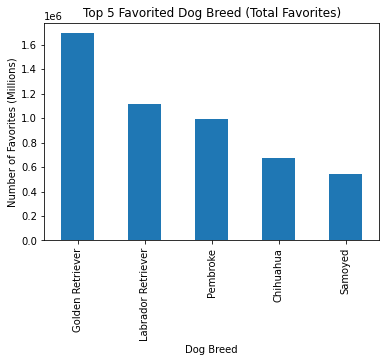

In [74]:
breed_table = df_clean.groupby('first_prediction')['favorite_count'].sum().sort_values(ascending=False).nlargest(5)
breed_table.plot(kind='bar', title='Top 5 Favorited Dog Breed (Total Favorites)')
plt.xlabel('Dog Breed')
plt.ylabel('Number of Favorites (Millions)')

Let's also take a look at the Top five predicted breeds that had the highest favorites for an individual post to make a visual comparison:

Text(0, 0.5, 'Number of Favorites')

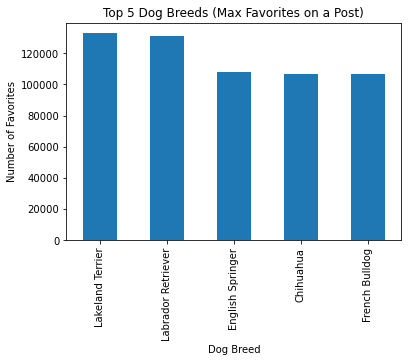

In [77]:
breed_table_max = df_clean.groupby('first_prediction')['favorite_count'].max().sort_values(ascending=False).nlargest(5)
breed_table_max.plot(kind='bar', title='Top 5 Dog Breeds (Max Favorites on a Post)')
plt.xlabel('Dog Breed')
plt.ylabel('Number of Favorites')